In [73]:
import polars as pl
from reader import read_ports_table

In [74]:
scaling = 100 # we'll reproduce everything to run 100x faster than real time.
# capture1_default_settings
# capture2_small_settings
# capture3_more_data
# capture4_1row_small_settings_long_window
# capture5_10_row_small_settings_long_window
data_dir = 'capture1_default_settings'

In [75]:
data = read_ports_table({9000: 'ilp', 10101: 'replication'}, data_dir=data_dir, scale_ts=scaling)

In [76]:
data

ts,ilp,replication
datetime[ns],u64,u64
2024-02-05 15:00:28.021536,0,376
2024-02-05 15:00:28.314336,0,414
2024-02-05 15:00:28.919636,0,667
2024-02-05 15:00:28.950336,0,699
2024-02-05 15:00:28.956036,0,649
2024-02-05 15:00:28.957536,0,677
2024-02-05 15:00:28.957836,0,690
2024-02-05 15:00:28.969836,0,669
2024-02-05 15:00:29.264036,0,460


In [89]:
grouping_window = 60 * 1000  # millis
scale = 1000 / grouping_window
grouped = data.group_by_dynamic("ts", every=f"{grouping_window}ms").agg(pl.col("ilp").sum() * scale, pl.col("replication").sum() * scale)
# grouped = grouped.with_columns(
#     ampli = pl.col("replication") / pl.col("ilp")
# )
grouped

ts,ilp,replication
datetime[ns],f64,f64
2024-02-05 15:00:00,0.0,138.016667
2024-02-05 15:10:00,32.133333,23.7
2024-02-05 15:11:00,425.766667,562.75
2024-02-05 15:12:00,417.733333,673.5
2024-02-05 15:13:00,409.7,765.533333
2024-02-05 15:14:00,417.733333,856.883333
2024-02-05 15:15:00,433.8,953.766667
2024-02-05 15:16:00,433.8,1057.216667
2024-02-05 15:17:00,417.733333,949.366667


In [90]:
import plotly.express as px

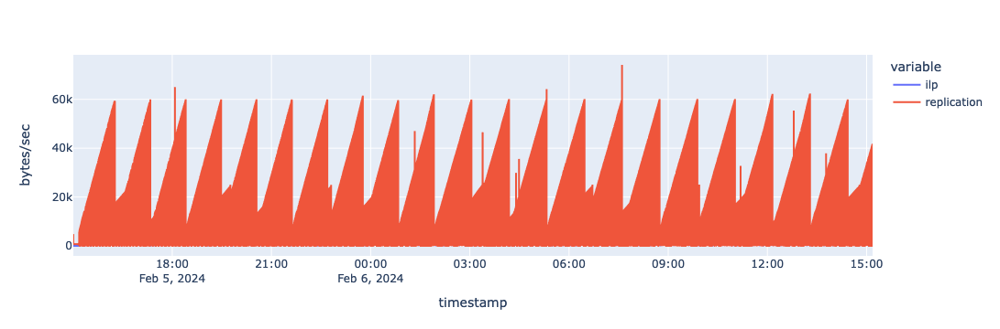

In [86]:
fig = px.line(grouped, x='ts', y=['ilp', 'replication'], markers=False, line_shape='hv',
             labels={'ts': 'timestamp', 'value': 'bytes/sec',})
fig.show()

In [87]:
write_ampli = (grouped.select(pl.sum("replication")) / grouped.select(pl.sum("ilp")))[0, 0] * 100.0
print(f'Replication uses {write_ampli:.2f}% bandwidth compared to the incoming ILP traffic.')

Replication uses 873.18% bandwidth compared to the incoming ILP traffic.
